# STAX pinpointed cell type, domain type, and disease-related specific genes in cell and gene co-embedding

## Load package

In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import scanpy as sc
import pandas as pd
import numpy as np
import torch
import dgl
import random
from scipy.sparse import csr_matrix
from sklearn.metrics import adjusted_rand_score as ari_score
from sklearn.metrics.cluster import normalized_mutual_info_score

In [5]:
import STA as sta

In [6]:
import os

In [7]:
seed = 42
random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)
dgl.random.seed(seed)

## MERFISH cell type

### load data

In [7]:
files = os.listdir('./data/5Co_embedding/MERFISH/')
files = [file.split('.')[0] for file in files]
files

['MERFISH4', 'MERFISH1', 'MERFISH5', 'MERFISH3', 'MERFISH2']

In [8]:
files = ['MERFISH1', 'MERFISH2', 'MERFISH3', 'MERFISH4', 'MERFISH5']

In [9]:
data_list = [sc.read_h5ad(f'./data/5Co_embedding/MERFISH/{file}.h5ad') for file in files]
data_list

[AnnData object with n_obs × n_vars = 5488 × 155
     obs: 'cell_class', 'neuron_class', 'domain', 'Region', 'ground_truth'
     uns: 'domain_colors'
     obsm: 'spatial',
 AnnData object with n_obs × n_vars = 5557 × 155
     obs: 'cell_class', 'neuron_class', 'domain', 'Region', 'ground_truth'
     uns: 'domain_colors'
     obsm: 'spatial',
 AnnData object with n_obs × n_vars = 5926 × 155
     obs: 'cell_class', 'neuron_class', 'domain', 'Region', 'ground_truth'
     uns: 'domain_colors'
     obsm: 'spatial',
 AnnData object with n_obs × n_vars = 5803 × 155
     obs: 'cell_class', 'neuron_class', 'domain', 'Region', 'ground_truth'
     uns: 'domain_colors'
     obsm: 'spatial',
 AnnData object with n_obs × n_vars = 5543 × 155
     obs: 'cell_class', 'neuron_class', 'domain', 'Region', 'ground_truth'
     uns: 'domain_colors'
     obsm: 'spatial']

### Preprocess the data

In [10]:
batch_key = 'batch'
batch_names = files

adata = sta.pp.process_adata(data_list, label=batch_key, keys=batch_names, n_top_features=5000, norm=True, scale='log', target_sum=1e4)
adata

View of AnnData object with n_obs × n_vars = 28317 × 155
    obs: 'cell_class', 'neuron_class', 'domain', 'Region', 'ground_truth', 'original_index', 'spot_quality', 'batch'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'log1p'
    obsm: 'spatial'
    layers: 'counts', 'norm_log'

In [11]:
adata.obs.loc[:, 'cell_class'].value_counts()

cell_class
Inhibitory       12369
Excitatory        5787
Astrocyte         3406
Endothelial 1     1480
Ependymal         1287
OD Mature 2       1153
OD Immature 1     1012
Microglia          594
Endothelial 3      549
OD Mature 1        238
Pericytes          204
Endothelial 2      144
OD Mature 4         47
OD Immature 2       33
OD Mature 3         14
Name: count, dtype: int64

In [12]:
cell_dict = {'Inhibitory': 'Inhibitory',
 'Excitatory': 'Excitatory',
 'Astrocyte': 'Astrocyte',
 'Endothelial 1': 'Endothelial',
 'Ependymal': 'Ependymal',
 'OD Mature 2': 'Mature oligodendrocyte',
 'OD Immature 1': 'Immature oligodendrocyte',
 'Microglia': 'Microglia',
 'Endothelial 3': 'Endothelial',
 'OD Mature 1': 'Mature oligodendrocyte',
 'Pericytes': 'Pericytes and Mural',
 'Endothelial 2': 'Endothelial',
 'OD Mature 4': 'Mature oligodendrocyte',
 'OD Immature 2': 'Immature oligodendrocyte',
 'OD Mature 3': 'Mature oligodendrocyte'}

In [13]:
adata.obs.loc[:, 'cell_type'] = adata.obs.loc[:, 'cell_class'].apply(lambda x: cell_dict[x])
adata.obs['cell_type'] = adata.obs['cell_type'].astype('category')

In [14]:
adata.obs.loc[:, 'cell_type'].value_counts()

cell_type
Inhibitory                  12369
Excitatory                   5787
Astrocyte                    3406
Endothelial                  2173
Mature oligodendrocyte       1452
Ependymal                    1287
Immature oligodendrocyte     1045
Microglia                     594
Pericytes and Mural           204
Name: count, dtype: int64

### Construct graph

In [15]:
rad_cutoff_list = [0] * len(data_list)
adata, g = sta.pp.process_graph(adata, data_list, cutoff_list=rad_cutoff_list)

cal spatial net in data_list
------Calculating spatial graph...
The graph contains 0 edges, 5488 cells.
0.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 0 edges, 5557 cells.
0.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 0 edges, 5926 cells.
0.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 0 edges, 5803 cells.
0.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 0 edges, 5543 cells.
0.0000 neighbors per cell on average.


### Train

In [16]:
path_results = f'./log/merfish_sc/'

In [17]:
adata_STAX = sta.model.STAX(adata=adata,
                            n_epoch=500,
                            batch_size=len(adata),
                            verbose=False,
                            gpu=0,
                            random_seed=42,
                            output_dir=path_results,
                            )

Epochs: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:21<00:00, 23.71it/s, recon_loss_mse=346.2709, kl_loss=24.5165, lr: 0.0]


### Clustering

In [18]:
sc.pp.neighbors(adata_STAX, use_rep='X_STAX')
sc.tl.umap(adata_STAX)

In [19]:
sc.tl.louvain(adata_STAX, random_state=666, key_added="louvain", resolution=0.5)

In [20]:
sc.tl.leiden(adata_STAX, random_state=666, key_added="leiden", resolution=0.5)

### Visualize Results of full batch

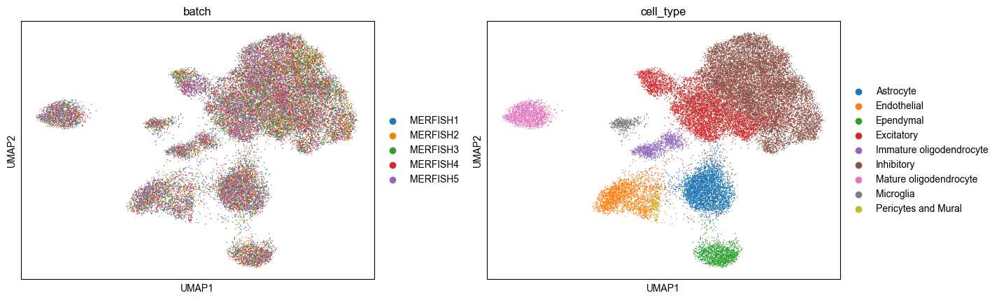

In [21]:
sc.pl.umap(adata_STAX, color=['batch', 'cell_type'], wspace=0.2)

### cell and gene co_embedding

In [22]:
adata_cell_gene = sta.tl.gene_embedding(adata_STAX, cell_key='X_STAX', gene_key='gene_embedding', T=1e-1)
adata_cell_gene

Performing softmax transformation for query data 0;


AnnData object with n_obs × n_vars = 28472 × 16
    obs: 'cell_class', 'neuron_class', 'domain', 'Region', 'ground_truth', 'original_index', 'spot_quality', 'batch', 'cell_type', 'louvain', 'leiden', 'cell_gene', 'id_dataset', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'

In [23]:
sc.pp.neighbors(adata_cell_gene, n_neighbors=50)
sc.tl.umap(adata_cell_gene)

In [24]:
sc.tl.leiden(adata_cell_gene, resolution=0.5)

In [25]:
adata_cell_gene.uns['cell_gene_colors'] = ['#A8CAE8', '#F31329']

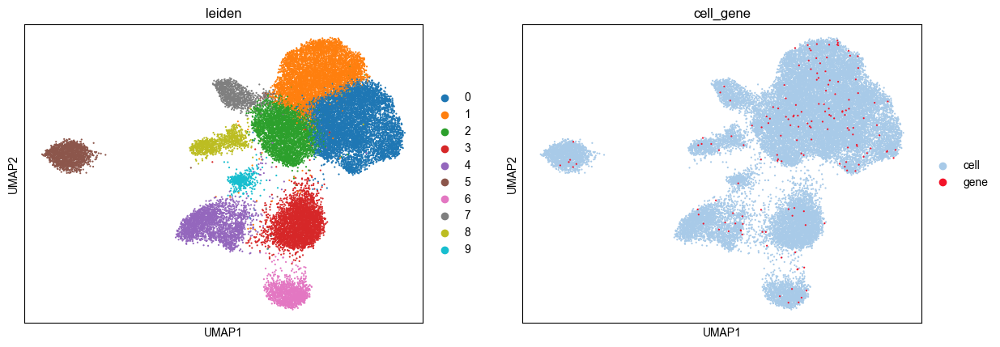

In [26]:
sc.pl.umap(adata_cell_gene, color=['leiden', 'cell_gene'], size=10)

In [27]:
genes = ["Gad1", "Slc17a6", "Ttyh2", "Mbp", "Pdgfra", "Aqp4", "Selplg", "Cd24a", "Fn1", "Myh11"]

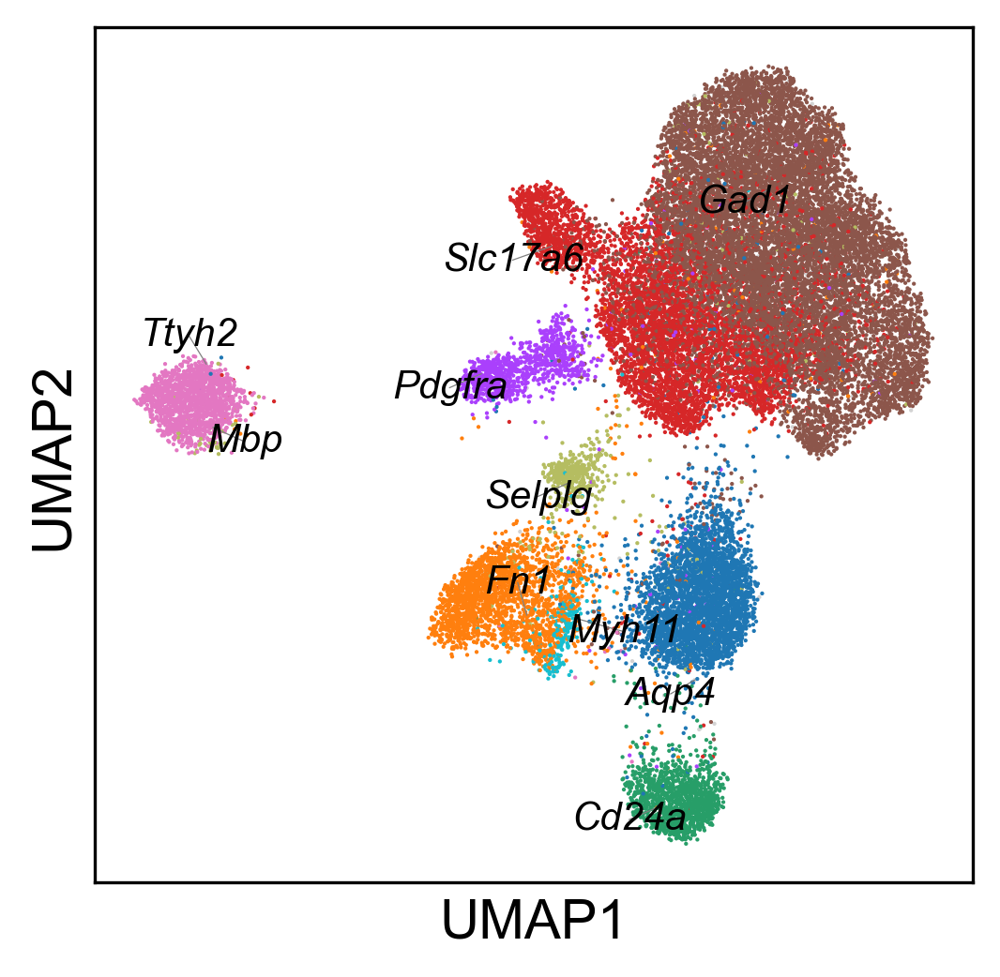

In [29]:
fig = sta.pl.plot_cell_gene(adata_cell_gene, genes, scanpy_color='cell_type', legend_loc=None, title='', dpi=150, figsize=(4, 4), frameon=True)

## MERFISH domain type

### load data

In [30]:
files = os.listdir('./data/5Co_embedding/MERFISH/')
files = [file.split('.')[0] for file in files]
files

['MERFISH4', 'MERFISH1', 'MERFISH5', 'MERFISH3', 'MERFISH2']

In [31]:
files = ['MERFISH1', 'MERFISH2', 'MERFISH3', 'MERFISH4', 'MERFISH5']

In [32]:
data_list = [sc.read_h5ad(f'./data/5Co_embedding/MERFISH/{file}.h5ad') for file in files]
data_list

[AnnData object with n_obs × n_vars = 5488 × 155
     obs: 'cell_class', 'neuron_class', 'domain', 'Region', 'ground_truth'
     uns: 'domain_colors'
     obsm: 'spatial',
 AnnData object with n_obs × n_vars = 5557 × 155
     obs: 'cell_class', 'neuron_class', 'domain', 'Region', 'ground_truth'
     uns: 'domain_colors'
     obsm: 'spatial',
 AnnData object with n_obs × n_vars = 5926 × 155
     obs: 'cell_class', 'neuron_class', 'domain', 'Region', 'ground_truth'
     uns: 'domain_colors'
     obsm: 'spatial',
 AnnData object with n_obs × n_vars = 5803 × 155
     obs: 'cell_class', 'neuron_class', 'domain', 'Region', 'ground_truth'
     uns: 'domain_colors'
     obsm: 'spatial',
 AnnData object with n_obs × n_vars = 5543 × 155
     obs: 'cell_class', 'neuron_class', 'domain', 'Region', 'ground_truth'
     uns: 'domain_colors'
     obsm: 'spatial']

### Preprocess the data

In [33]:
batch_key = 'batch'
batch_names = files

adata = sta.pp.process_adata(data_list, label=batch_key, keys=batch_names, n_top_features=5000, norm=True, scale='log', target_sum=1e4)
adata

View of AnnData object with n_obs × n_vars = 28317 × 155
    obs: 'cell_class', 'neuron_class', 'domain', 'Region', 'ground_truth', 'original_index', 'spot_quality', 'batch'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'log1p'
    obsm: 'spatial'
    layers: 'counts', 'norm_log'

In [34]:
adata.obs.loc[:, 'cell_class'].value_counts()

cell_class
Inhibitory       12369
Excitatory        5787
Astrocyte         3406
Endothelial 1     1480
Ependymal         1287
OD Mature 2       1153
OD Immature 1     1012
Microglia          594
Endothelial 3      549
OD Mature 1        238
Pericytes          204
Endothelial 2      144
OD Mature 4         47
OD Immature 2       33
OD Mature 3         14
Name: count, dtype: int64

In [35]:
cell_dict = {'Inhibitory': 'Inhibitory',
 'Excitatory': 'Excitatory',
 'Astrocyte': 'Astrocyte',
 'Endothelial 1': 'Endothelial',
 'Ependymal': 'Ependymal',
 'OD Mature 2': 'Mature oligodendrocyte',
 'OD Immature 1': 'Immature oligodendrocyte',
 'Microglia': 'Microglia',
 'Endothelial 3': 'Endothelial',
 'OD Mature 1': 'Mature oligodendrocyte',
 'Pericytes': 'Pericytes and Mural',
 'Endothelial 2': 'Endothelial',
 'OD Mature 4': 'Mature oligodendrocyte',
 'OD Immature 2': 'Immature oligodendrocyte',
 'OD Mature 3': 'Mature oligodendrocyte'}

In [36]:
adata.obs.loc[:, 'cell_type'] = adata.obs.loc[:, 'cell_class'].apply(lambda x: cell_dict[x])
adata.obs['cell_type'] = adata.obs['cell_type'].astype('category')

In [37]:
adata.obs.loc[:, 'cell_type'].value_counts()

cell_type
Inhibitory                  12369
Excitatory                   5787
Astrocyte                    3406
Endothelial                  2173
Mature oligodendrocyte       1452
Ependymal                    1287
Immature oligodendrocyte     1045
Microglia                     594
Pericytes and Mural           204
Name: count, dtype: int64

### Construct graph

In [38]:
rad_cutoff_list = [50] * len(data_list)
adata, g = sta.pp.process_graph(adata, data_list, cutoff_list=rad_cutoff_list)

cal spatial net in data_list
------Calculating spatial graph...
The graph contains 74900 edges, 5488 cells.
13.6480 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 80046 edges, 5557 cells.
14.4045 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 86676 edges, 5926 cells.
14.6264 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 83516 edges, 5803 cells.
14.3919 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 75052 edges, 5543 cells.
13.5400 neighbors per cell on average.


### Train

In [39]:
path_results = f'./log/merfish_dt/'

In [40]:
adata_STAX = sta.model.STAX(adata=adata,
                            n_epoch=500,
                            batch_size=len(adata),
                            verbose=False,
                            gpu=0,
                            random_seed=42,
                            output_dir=path_results,
                            )

Epochs: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:23<00:00, 21.56it/s, recon_loss_mse=495.8868, kl_loss=6.9283, lr: 0.0]


### Clustering

In [41]:
sc.pp.neighbors(adata_STAX, use_rep='X_STAX')
sc.tl.umap(adata_STAX)

In [42]:
sc.tl.louvain(adata_STAX, random_state=666, key_added="louvain", resolution=0.4)

In [43]:
sc.tl.leiden(adata_STAX, random_state=666, key_added="leiden", resolution=0.3)

### Visualize Results of full batch

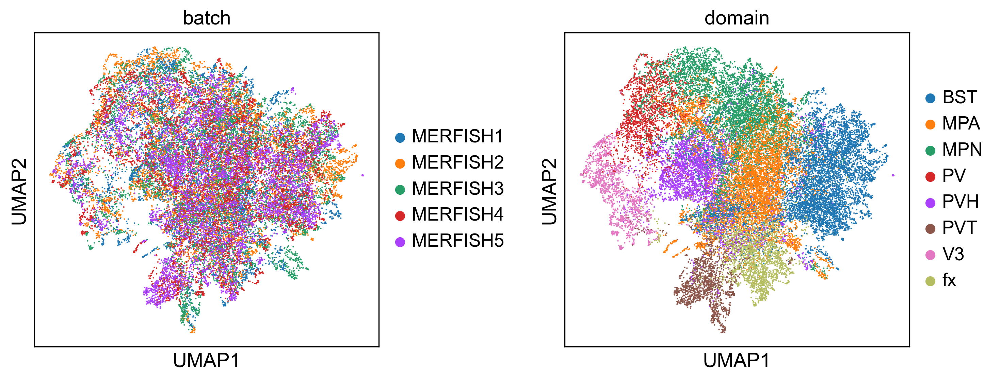

In [49]:
sc.pl.umap(adata_STAX, color=['batch', 'domain'], wspace=0.4)

### cell and gene co_embedding

In [50]:
adata_cell_gene = sta.tl.gene_embedding(adata_STAX, cell_key='X_STAX', gene_key='gene_embedding', T=1e-1)
adata_cell_gene

Performing softmax transformation for query data 0;


AnnData object with n_obs × n_vars = 28472 × 16
    obs: 'cell_class', 'neuron_class', 'domain', 'Region', 'ground_truth', 'original_index', 'spot_quality', 'batch', 'cell_type', 'louvain', 'leiden', 'cell_gene', 'id_dataset', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'

In [51]:
sc.pp.neighbors(adata_cell_gene, n_neighbors=50)
sc.tl.umap(adata_cell_gene)

In [52]:
sc.tl.leiden(adata_cell_gene, resolution=0.5)

In [53]:
adata_cell_gene.uns['cell_gene_colors'] = ['#A8CAE8', '#F31329']

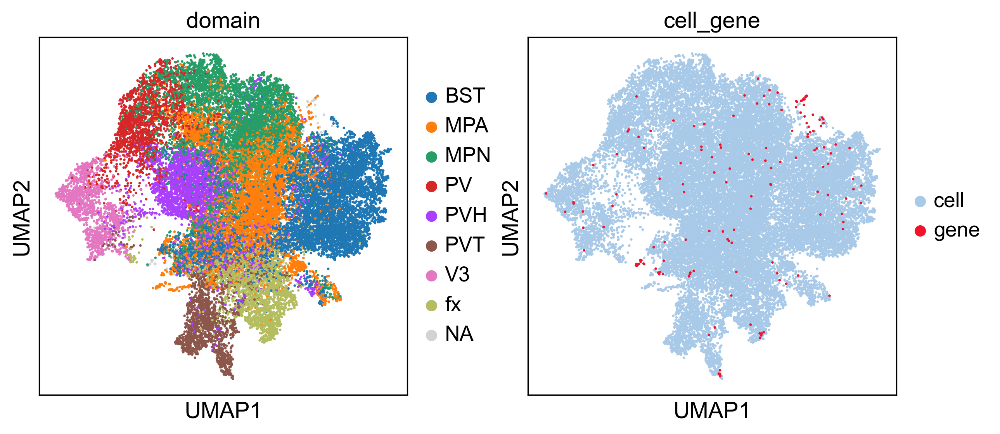

In [54]:
sc.pl.umap(adata_cell_gene, color=['domain', 'cell_gene'], size=10)

In [55]:
genes = ["Sytl4", "Cd24a", "Slc18a2", "Necab1", "Nts", "Mbp"]

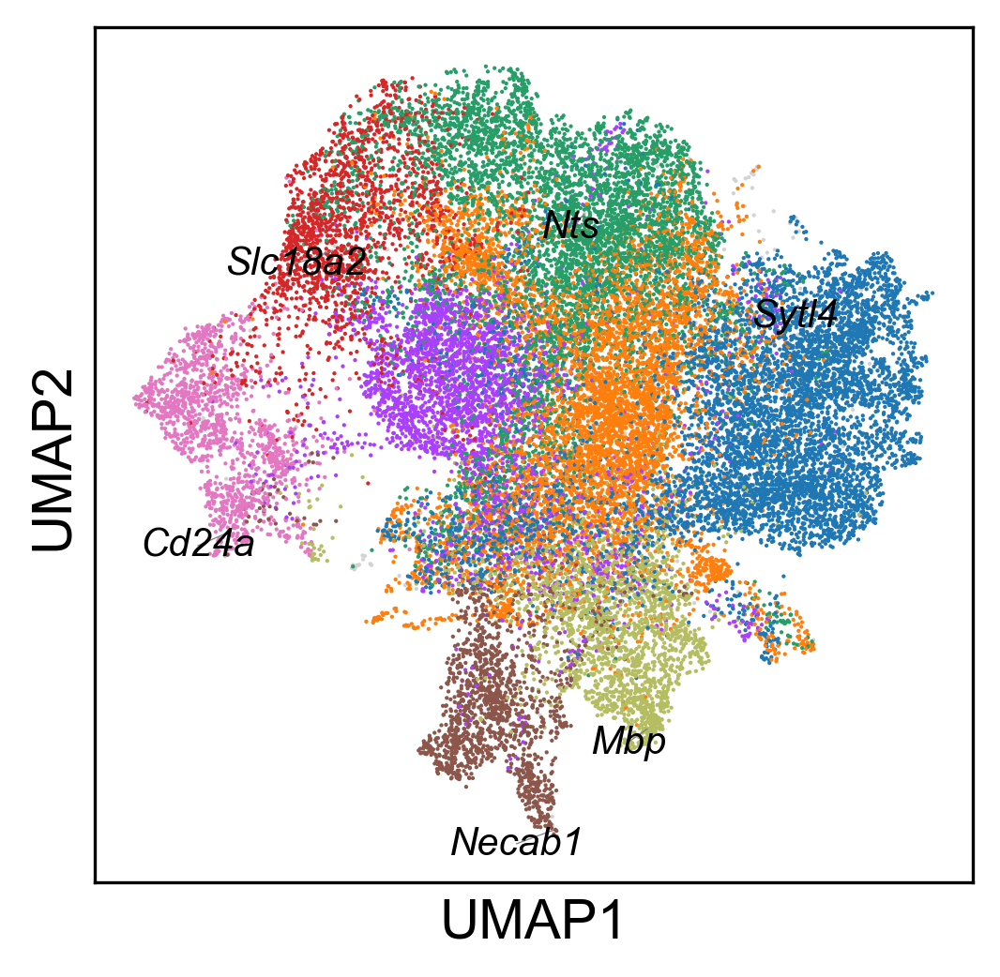

In [56]:
fig = sta.pl.plot_cell_gene(adata_cell_gene, genes, scanpy_color='domain', legend_loc=None, title='', dpi=150, figsize=(4, 4), frameon=True)

## Hippocampus disease and normal

### load data

In [8]:
adata1 = sc.read_h5ad(f'./data/5Co_embedding/MouseBrainAD/Hippocampus_disease_celltype.h5ad')
adata1.obs_names_make_unique()
adata1.var_names_make_unique()
adata1

AnnData object with n_obs × n_vars = 15092 × 14622
    obs: 'batch_name', 'louvain', 'cell_type'
    var: 'n_cells', 'mt'
    uns: 'cell_type_colors'
    obsm: 'spatial'

In [9]:
adata1.X.max()

506.0

In [10]:
adata2 = sc.read_h5ad(f'./data/5Co_embedding/MouseBrainAD/Hippocampus_normal_celltype.h5ad')
adata2.obs_names_make_unique()
adata2.var_names_make_unique()
adata2

AnnData object with n_obs × n_vars = 12822 × 14622
    obs: 'batch_name', 'louvain', 'cell_type'
    var: 'n_cells', 'mt'
    uns: 'louvain_colors'
    obsm: 'spatial'

In [11]:
adata2.X.max()

66.0

### Preprocess the data

In [12]:
data_list = [adata1, adata2]
batch_key = 'batch'
batch_names = ['adata1', 'adata2']

adata = sta.pp.process_adata(data_list, label=batch_key, keys=batch_names, n_top_features=5000, norm=True, scale='log', target_sum=1e4)
adata

View of AnnData object with n_obs × n_vars = 27914 × 5000
    obs: 'batch_name', 'louvain', 'cell_type', 'original_index', 'spot_quality', 'batch'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'log1p'
    obsm: 'spatial'
    layers: 'counts', 'norm_log'

In [13]:
adata.X.max()

7.7291756

### Construct graph

In [14]:
rad_cutoff_list = [20, 30]
adata, g = sta.pp.process_graph(adata, data_list, cutoff_list=rad_cutoff_list)

cal spatial net in data_list
------Calculating spatial graph...
The graph contains 43938 edges, 15092 cells.
2.9113 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 27318 edges, 12822 cells.
2.1306 neighbors per cell on average.


### Train

In [15]:
path_results = f'./log/integration/'

In [16]:
adata_STAX = sta.model.STAX(adata=adata,
                            n_epoch=500,
                            batch_size=len(adata),
                            verbose=False,
                            gpu=0,
                            random_seed=42,
                            output_dir=path_results,
                            )

Epochs: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:55<00:00,  4.33it/s, recon_loss_mse=727.8628, kl_loss=9.5547, lr: 0.0]


### Clustering

In [17]:
sc.pp.neighbors(adata_STAX, use_rep='X_STAX')

In [18]:
sc.tl.louvain(adata_STAX, random_state=666, key_added="louvain", resolution=1)

In [19]:
sc.tl.leiden(adata_STAX, random_state=666, key_added="leiden", resolution=1)

In [20]:
sta.tl.kmeans_cluster(adata_STAX, mode='KMeans', used_embedding='X_STAX', n_clusters=15)

AnnData object with n_obs × n_vars = 27914 × 5000
    obs: 'batch_name', 'louvain', 'cell_type', 'original_index', 'spot_quality', 'batch', 'leiden', 'kmeans'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'log1p', 'adj', 'neighbors', 'louvain', 'leiden'
    obsm: 'spatial', 'X_STAX'
    varm: 'gene_embedding'
    layers: 'counts', 'norm_log', 'impute'
    obsp: 'distances', 'connectivities'

In [21]:
sc.tl.umap(adata_STAX)

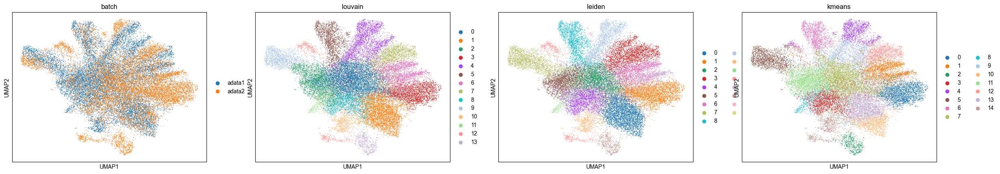

In [22]:
sc.pl.umap(adata_STAX, color=['batch', 'louvain', 'leiden', 'kmeans'], ncols=5)

## cell and gene co_embedding

In [23]:
adata_cell_gene = sta.tl.gene_embedding(adata_STAX, cell_key='X_STAX', gene_key='gene_embedding', T=1e-1)
adata_cell_gene

Performing softmax transformation for query data 0;


AnnData object with n_obs × n_vars = 32914 × 16
    obs: 'batch_name', 'louvain', 'cell_type', 'original_index', 'spot_quality', 'batch', 'leiden', 'kmeans', 'cell_gene', 'id_dataset', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'

In [24]:
adata_cell_gene.obs

,batch_name,louvain,cell_type,original_index,spot_quality,batch,leiden,kmeans,cell_gene,id_dataset,highly_variable,highly_variable_rank,means,variances,variances_norm,highly_variable_nbatches
adata1_0,j20_rep1,5,CA3,0.0,real,adata1,8,6,cell,ref,NaN,NaN,NaN,NaN,NaN,NaN
adata1_1,j20_rep1,5,CA3,1.0,real,adata1,8,6,cell,ref,NaN,NaN,NaN,NaN,NaN,NaN
adata1_2,j20_rep1,5,CA3,2.0,real,adata1,8,6,cell,ref,NaN,NaN,NaN,NaN,NaN,NaN
adata1_3,j20_rep1,4,CA1,3.0,real,adata1,9,4,cell,ref,NaN,NaN,NaN,NaN,NaN,NaN
adata1_4,j20_rep1,5,CA3,4.0,real,adata1,8,6,cell,ref,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zswim3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,1072.0,0.003833,0.004607,1.055651,1.0
Zswim5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,990.5,0.008992,0.013354,1.242854,2.0
Zswim6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,1392.0,0.026868,0.041911,1.181054,2.0
Zw10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,2260.0,0.009852,0.011976,1.015077,1.0


In [25]:
sc.pp.neighbors(adata_cell_gene, n_neighbors=50)

In [26]:
sc.tl.umap(adata_cell_gene)

In [27]:
# adata_cell_gene.uns['cell_gene_colors'] = ['#A8CAE8', '#E64825']
adata_cell_gene.uns['cell_gene_colors'] = ['#A8CAE8', '#F31329']
color_cell_gene = {'cell': '#A8CAE8', 'gene': '#F31329'}

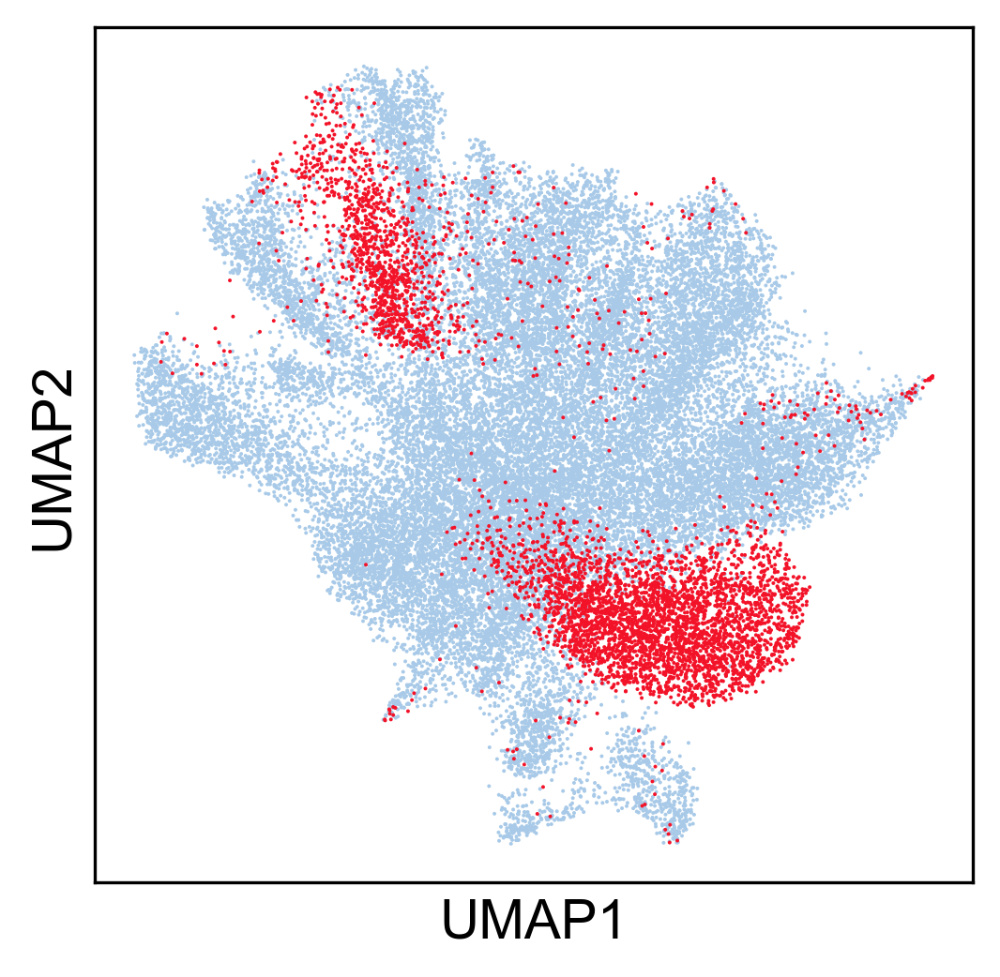

In [28]:
fig = sta.pl.plot_cell_gene(adata_cell_gene, None, scanpy_color='cell_gene', legend_loc=None, title='', dpi=150, figsize=(4, 4), frameon=True)

In [29]:
adata_cell_gene.obs

,batch_name,louvain,cell_type,original_index,spot_quality,batch,leiden,kmeans,cell_gene,id_dataset,highly_variable,highly_variable_rank,means,variances,variances_norm,highly_variable_nbatches
adata1_0,j20_rep1,5,CA3,0.0,real,adata1,8,6,cell,ref,NaN,NaN,NaN,NaN,NaN,NaN
adata1_1,j20_rep1,5,CA3,1.0,real,adata1,8,6,cell,ref,NaN,NaN,NaN,NaN,NaN,NaN
adata1_2,j20_rep1,5,CA3,2.0,real,adata1,8,6,cell,ref,NaN,NaN,NaN,NaN,NaN,NaN
adata1_3,j20_rep1,4,CA1,3.0,real,adata1,9,4,cell,ref,NaN,NaN,NaN,NaN,NaN,NaN
adata1_4,j20_rep1,5,CA3,4.0,real,adata1,8,6,cell,ref,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zswim3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,1072.0,0.003833,0.004607,1.055651,1.0
Zswim5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,990.5,0.008992,0.013354,1.242854,2.0
Zswim6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,1392.0,0.026868,0.041911,1.181054,2.0
Zw10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,2260.0,0.009852,0.011976,1.015077,1.0


In [30]:
adata_cell_gene.obs.loc[:, 'batch_gene'] = adata_cell_gene.obs.loc[:, 'batch']
adata_cell_gene.obs['batch_gene'] = adata_cell_gene.obs['batch_gene'].cat.add_categories('gene')
adata_cell_gene.obs['batch_gene'].fillna('gene', inplace=True)  # 现在可以赋值
adata_cell_gene.obs

,batch_name,louvain,cell_type,original_index,spot_quality,batch,leiden,kmeans,cell_gene,id_dataset,highly_variable,highly_variable_rank,means,variances,variances_norm,highly_variable_nbatches,batch_gene
adata1_0,j20_rep1,5,CA3,0.0,real,adata1,8,6,cell,ref,NaN,NaN,NaN,NaN,NaN,NaN,adata1
adata1_1,j20_rep1,5,CA3,1.0,real,adata1,8,6,cell,ref,NaN,NaN,NaN,NaN,NaN,NaN,adata1
adata1_2,j20_rep1,5,CA3,2.0,real,adata1,8,6,cell,ref,NaN,NaN,NaN,NaN,NaN,NaN,adata1
adata1_3,j20_rep1,4,CA1,3.0,real,adata1,9,4,cell,ref,NaN,NaN,NaN,NaN,NaN,NaN,adata1
adata1_4,j20_rep1,5,CA3,4.0,real,adata1,8,6,cell,ref,NaN,NaN,NaN,NaN,NaN,NaN,adata1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zswim3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,1072.0,0.003833,0.004607,1.055651,1.0,gene
Zswim5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,990.5,0.008992,0.013354,1.242854,2.0,gene
Zswim6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,1392.0,0.026868,0.041911,1.181054,2.0,gene
Zw10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,2260.0,0.009852,0.011976,1.015077,1.0,gene


In [42]:
adata_cell_gene.obsm['X'] = adata_cell_gene.X

In [43]:
adata_cell = adata_cell_gene[adata_cell_gene.obs.loc[:, 'cell_gene'] == 'cell', :]
adata_cell

View of AnnData object with n_obs × n_vars = 27914 × 16
    obs: 'batch_name', 'louvain', 'cell_type', 'original_index', 'spot_quality', 'batch', 'leiden', 'kmeans', 'cell_gene', 'id_dataset', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'batch_gene'
    uns: 'neighbors', 'umap', 'cell_gene_colors'
    obsm: 'X_umap', 'X'
    obsp: 'distances', 'connectivities'

In [44]:
adata_gene = adata_cell_gene[adata_cell_gene.obs.loc[:, 'cell_gene'] == 'gene', :]
adata_gene

View of AnnData object with n_obs × n_vars = 5000 × 16
    obs: 'batch_name', 'louvain', 'cell_type', 'original_index', 'spot_quality', 'batch', 'leiden', 'kmeans', 'cell_gene', 'id_dataset', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'batch_gene'
    uns: 'neighbors', 'umap', 'cell_gene_colors'
    obsm: 'X_umap', 'X'
    obsp: 'distances', 'connectivities'

In [45]:
y_pred, y_prob = sta.tl.label_transfer(adata_cell, adata_gene, rep='X', label='louvain', n_neighbors=10, threshold=0)

In [46]:
adata_gene.obs.loc[:, 'louvain'] = y_pred
adata_gene

View of AnnData object with n_obs × n_vars = 5000 × 16
    obs: 'batch_name', 'louvain', 'cell_type', 'original_index', 'spot_quality', 'batch', 'leiden', 'kmeans', 'cell_gene', 'id_dataset', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'batch_gene'
    uns: 'neighbors', 'umap', 'cell_gene_colors'
    obsm: 'X_umap', 'X'
    obsp: 'distances', 'connectivities'

In [47]:
adata_cell_gene.obs.loc[adata_cell_gene.obs.loc[:, 'cell_gene'] == 'gene', 'louvain'] = y_pred
adata_cell_gene.obs

,batch_name,louvain,cell_type,original_index,spot_quality,batch,leiden,kmeans,cell_gene,id_dataset,highly_variable,highly_variable_rank,means,variances,variances_norm,highly_variable_nbatches,batch_gene
adata1_0,j20_rep1,5,CA3,0.0,real,adata1,8,6,cell,ref,NaN,NaN,NaN,NaN,NaN,NaN,adata1
adata1_1,j20_rep1,5,CA3,1.0,real,adata1,8,6,cell,ref,NaN,NaN,NaN,NaN,NaN,NaN,adata1
adata1_2,j20_rep1,5,CA3,2.0,real,adata1,8,6,cell,ref,NaN,NaN,NaN,NaN,NaN,NaN,adata1
adata1_3,j20_rep1,4,CA1,3.0,real,adata1,9,4,cell,ref,NaN,NaN,NaN,NaN,NaN,NaN,adata1
adata1_4,j20_rep1,5,CA3,4.0,real,adata1,8,6,cell,ref,NaN,NaN,NaN,NaN,NaN,NaN,adata1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zswim3,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,1072.0,0.003833,0.004607,1.055651,1.0,gene
Zswim5,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,990.5,0.008992,0.013354,1.242854,2.0,gene
Zswim6,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,1392.0,0.026868,0.041911,1.181054,2.0,gene
Zw10,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,2260.0,0.009852,0.011976,1.015077,1.0,gene


### DG, CA1, CA3

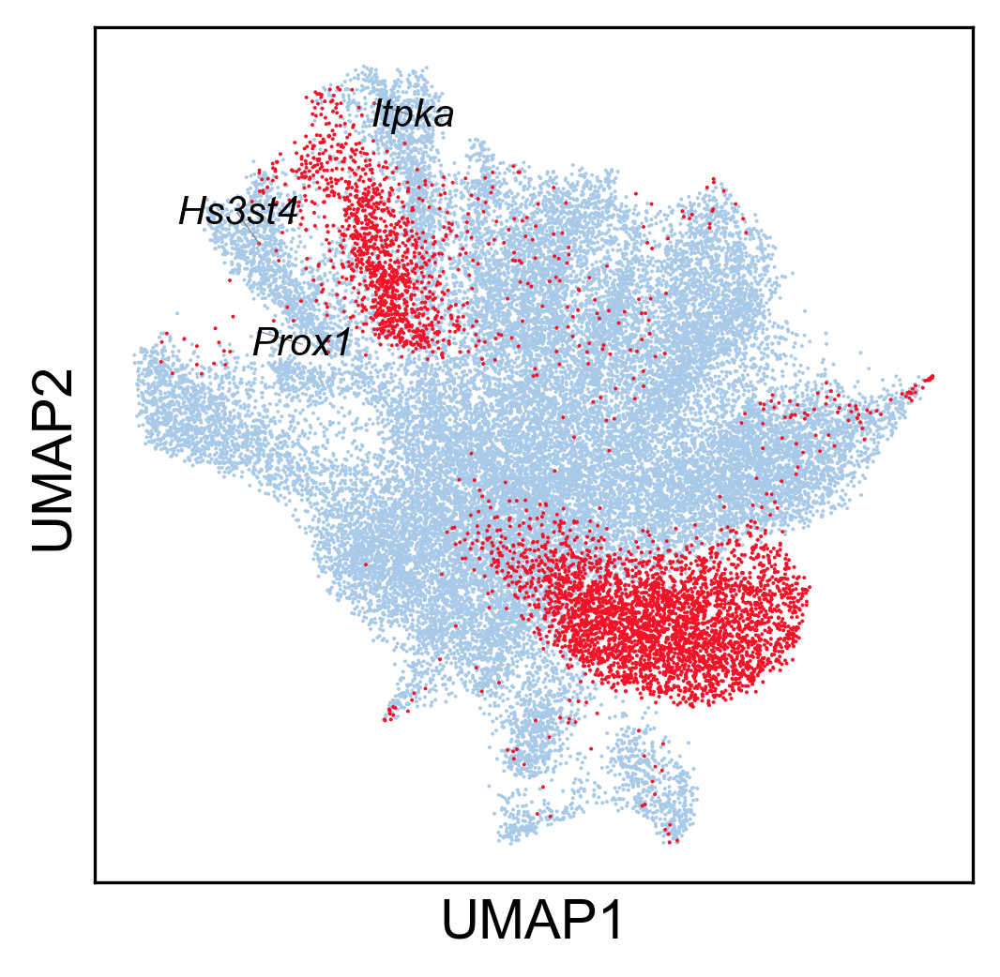

In [48]:
fig = sta.pl.plot_cell_gene(adata_cell_gene, ['Itpka', 'Hs3st4', 'Prox1'], scanpy_color='cell_gene', legend_loc=None, title='', dpi=150, figsize=(4, 4), frameon=True)

### AD

In [55]:
adata_expression = adata.copy()
adata_expression.obs.loc[:, 'louvain'] = adata_cell_gene[adata.obs.index, :].obs.loc[:, 'louvain'].tolist()
adata_expression = adata_expression[~adata_expression.obs.loc[:, 'louvain'].isin(['3','10']), :]
adata_expression

View of AnnData object with n_obs × n_vars = 24639 × 5000
    obs: 'batch_name', 'louvain', 'cell_type', 'original_index', 'spot_quality', 'batch', 'leiden', 'kmeans'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'log1p', 'adj', 'neighbors', 'louvain', 'leiden', 'umap', 'batch_colors', 'louvain_colors', 'leiden_colors', 'kmeans_colors'
    obsm: 'spatial', 'X_STAX', 'X_umap'
    varm: 'gene_embedding'
    layers: 'counts', 'norm_log', 'impute'
    obsp: 'distances', 'connectivities'

In [56]:
adata_cell_gene_sub = adata_cell_gene[adata_cell_gene.obs.loc[:, 'louvain'] == '11', :]
adata_cell_gene_sub

View of AnnData object with n_obs × n_vars = 750 × 16
    obs: 'batch_name', 'louvain', 'cell_type', 'original_index', 'spot_quality', 'batch', 'leiden', 'kmeans', 'cell_gene', 'id_dataset', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'batch_gene'
    uns: 'neighbors', 'umap', 'cell_gene_colors'
    obsm: 'X_umap', 'X'
    obsp: 'distances', 'connectivities'

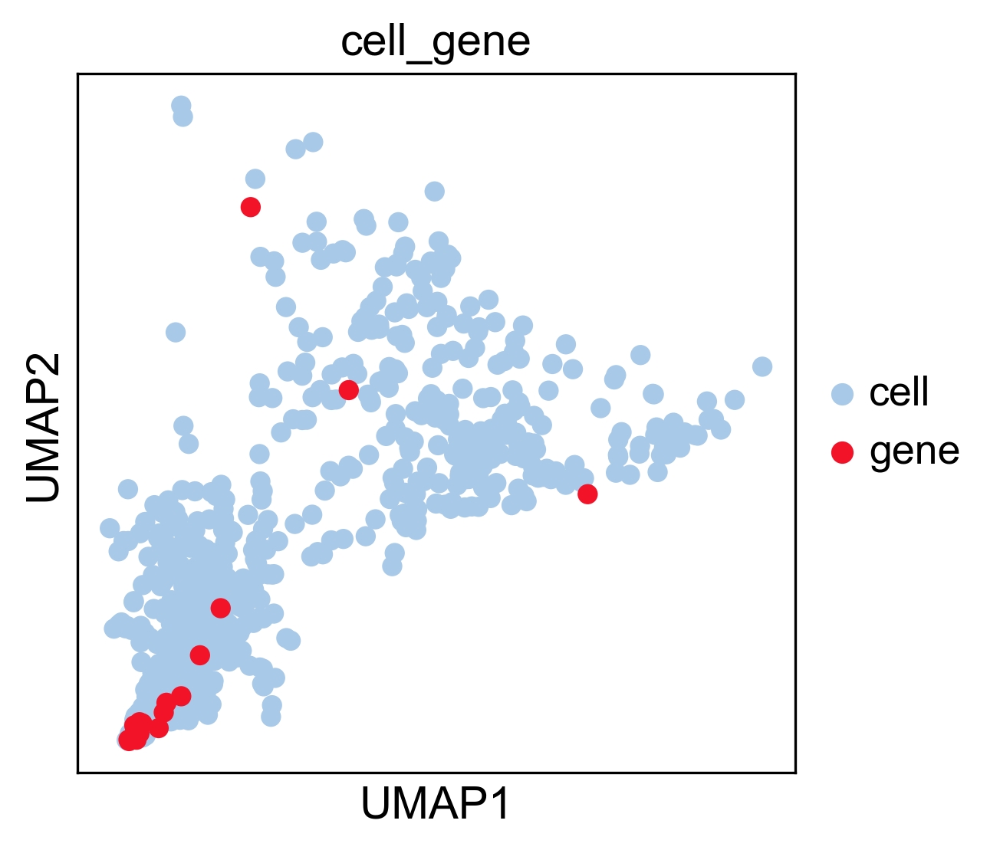

In [57]:
sc.pl.umap(adata_cell_gene_sub, color=['cell_gene'])

In [58]:
adata_cell_gene_sub_gene = adata_cell_gene_sub[adata_cell_gene_sub.obs.loc[:, 'cell_gene'] == 'gene', :]
adata_cell_gene_sub_gene

View of AnnData object with n_obs × n_vars = 18 × 16
    obs: 'batch_name', 'louvain', 'cell_type', 'original_index', 'spot_quality', 'batch', 'leiden', 'kmeans', 'cell_gene', 'id_dataset', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'batch_gene'
    uns: 'neighbors', 'umap', 'cell_gene_colors'
    obsm: 'X_umap', 'X'
    obsp: 'distances', 'connectivities'

In [59]:
adata_cell_gene_sub_gene.obs.index

Index(['C1qa', 'C1qb', 'C1qc', 'Cmss1', 'Csf1r', 'Ctsd', 'Ctss', 'Cx3cr1',
       'Cyba', 'Fcgr3', 'Fcrls', 'Gfap', 'Hexb', 'Laptm5', 'Lars2', 'P2ry12',
       'Tmem119', 'Trem2'],
      dtype='object')

In [60]:
deg = adata_cell_gene_sub_gene.obs.index.tolist()

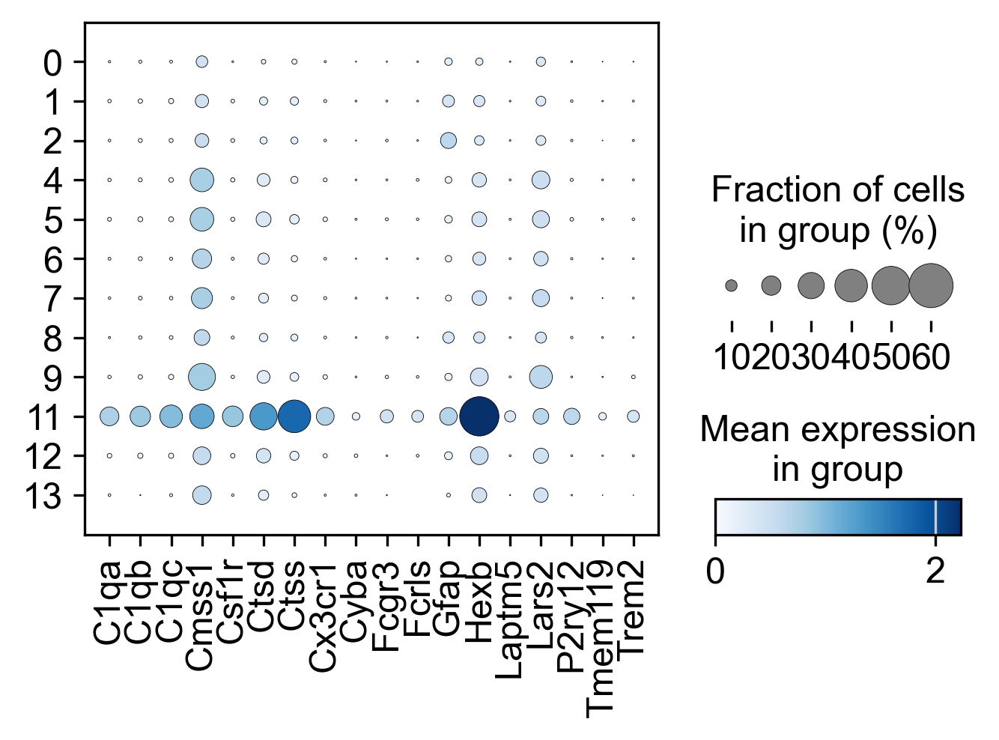

In [87]:
sc.pl.dotplot(adata_expression, deg, groupby="louvain", figsize=(5, 3), cmap='Blues');

In [62]:
from gprofiler import GProfiler

In [63]:
gp = GProfiler(return_dataframe=True)

In [64]:
len(deg)

18

In [65]:
results = gp.profile(query=deg, 
                     organism='mmusculus',  # mmusculus，hsapiens
                     # all_results=True,
                    )

In [66]:
results = results.loc[:, ['p_value', 'name', 'source', 'recall']]  # 
results.sort_values(by='p_value', ascending=True, inplace=True)  # 
results

,p_value,name,source,recall
0,2.572313e-10,synapse pruning,GO:BP,0.312500
1,4.735704e-09,cell junction disassembly,GO:BP,0.185185
2,2.310605e-08,complement component C1q complex,GO:CC,1.000000
3,2.310605e-08,complement component C1 complex,GO:CC,1.000000
4,3.564786e-07,Microglia pathogen phagocytosis pathway,WP,0.121951
...,...,...,...,...
136,4.176927e-02,regulation of biological quality,GO:BP,0.002830
137,4.263279e-02,autophagic cell death,GO:BP,0.142857
138,4.298464e-02,phosphatidylinositol 3-kinase/protein kinase B...,GO:BP,0.012903
139,4.917396e-02,response to macrophage colony-stimulating factor,GO:BP,0.133333


In [67]:
results.head(10)

,p_value,name,source,recall
0,2.572313e-10,synapse pruning,GO:BP,0.312500
1,4.735704e-09,cell junction disassembly,GO:BP,0.185185
2,2.310605e-08,complement component C1q complex,GO:CC,1.000000
3,2.310605e-08,complement component C1 complex,GO:CC,1.000000
4,3.564786e-07,Microglia pathogen phagocytosis pathway,WP,0.121951
5,2.304175e-06,gliogenesis,GO:BP,0.017857
6,3.003016e-06,positive regulation of macrophage migration,GO:BP,0.137931
7,5.080005e-06,positive regulation of microglial cell migration,GO:BP,0.500000
8,5.362341e-06,positive regulation of immune system process,GO:BP,0.008115
9,8.325822e-06,"complement activation, classical pathway",GO:BP,0.108108


In [68]:
results.loc[:, 'source'].value_counts()

source
GO:BP    100
GO:CC     17
KEGG      10
REAC       6
HP         5
WP         3
Name: count, dtype: int64

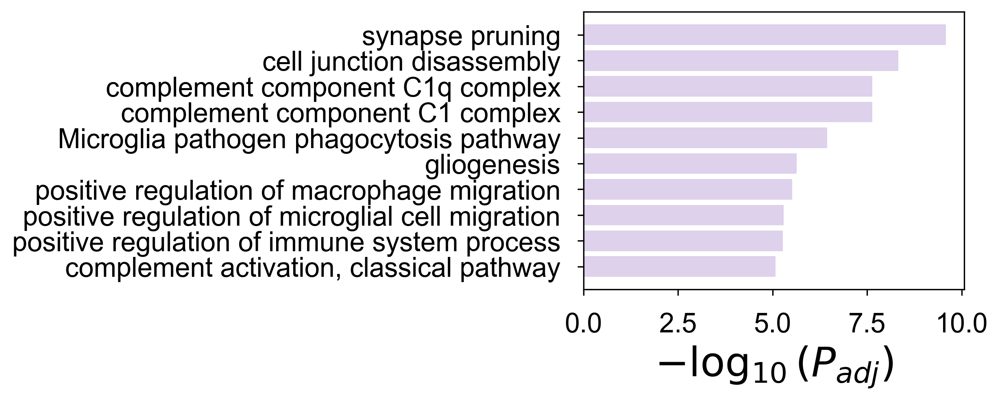

In [88]:
import matplotlib.pyplot as plt
results.index = range(len(results))
go_colors = ["#FFEBEDFF", "#FFCCD2FF", "#EE9999FF", "#E57272FF", "#EE5250FF",
             "#F34335FF", "#E53934FF", "#D22E2EFF", "#C52727FF", "#B71B1BFF"][::-1]

import matplotlib.colors

# alphas = np.linspace(0.1, 1, 10)
alphas = 0.3 # 透明度
rgba_colors = np.zeros((10, 4))
# for red the first column needs to be one
rgba_colors[:, :3] = matplotlib.colors.hex2color("tab:purple")
# the fourth column needs to be your alphas
rgba_colors[:, 3] = alphas
go_colors = rgba_colors[::-1]

plt.figure(figsize=(4, 3))

for i in range(10):
    plt.barh(10 - i, -np.log10(results.loc[i]['p_value']), color=go_colors[i])

plt.xticks(fontsize=16)
plt.yticks(10 - np.arange(10), [go for go in results['name'][:10].values], fontsize=16)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=10)
ax.xaxis.set_ticks_position('bottom')
ax.grid(False)
plt.xlabel("$-\log_{10}(P_{adj})$", fontsize=24)
# plt.savefig('./go_bp_0vs2.pdf')
plt.tight_layout()
# plt.savefig(f'./pipeline_my/GO_domain_AD')
plt.show()

In [71]:
adata_cell_gene_sub_gene.obs

,batch_name,louvain,cell_type,original_index,spot_quality,batch,leiden,kmeans,cell_gene,id_dataset,highly_variable,highly_variable_rank,means,variances,variances_norm,highly_variable_nbatches,batch_gene
C1qa,NaN,11,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,1023.0,0.027012,0.046059,1.107639,1.0,gene
C1qb,NaN,11,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,2267.0,0.035968,0.063981,1.154726,2.0,gene
C1qc,NaN,11,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,470.0,0.041771,0.087174,1.189325,1.0,gene
Cmss1,NaN,11,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,349.5,0.303002,1.425544,1.631767,2.0,gene
Csf1r,NaN,11,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,557.0,0.032923,0.063868,1.349358,2.0,gene
Ctsd,NaN,11,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,102.0,0.116644,0.401326,1.507476,1.0,gene
Ctss,NaN,11,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,152.0,0.095687,0.289737,1.756120,2.0,gene
Cx3cr1,NaN,11,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,1091.0,0.029734,0.058945,1.282510,2.0,gene
Cyba,NaN,11,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,3376.5,0.011428,0.015597,1.060430,2.0,gene
Fcgr3,NaN,11,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,2596.0,0.015440,0.022009,1.026045,1.0,gene


In [72]:
import networkx as nx

In [73]:
adata_cell_gene_sub

View of AnnData object with n_obs × n_vars = 750 × 16
    obs: 'batch_name', 'louvain', 'cell_type', 'original_index', 'spot_quality', 'batch', 'leiden', 'kmeans', 'cell_gene', 'id_dataset', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'batch_gene'
    uns: 'neighbors', 'umap', 'cell_gene_colors'
    obsm: 'X_umap', 'X'
    obsp: 'distances', 'connectivities'

In [74]:
G = nx.from_scipy_sparse_array(adata_cell_gene_sub.obsp['connectivities'])

In [75]:
clustering_coefficient = nx.clustering(G)

In [76]:
temp = adata_cell_gene_sub.copy()
temp.obs.loc[:, 'clustering_coefficient'] = list(clustering_coefficient.values())
temp

AnnData object with n_obs × n_vars = 750 × 16
    obs: 'batch_name', 'louvain', 'cell_type', 'original_index', 'spot_quality', 'batch', 'leiden', 'kmeans', 'cell_gene', 'id_dataset', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'batch_gene', 'clustering_coefficient'
    uns: 'neighbors', 'umap', 'cell_gene_colors'
    obsm: 'X_umap', 'X'
    obsp: 'distances', 'connectivities'

In [77]:
temp_gene = temp[temp.obs.loc[:, 'cell_gene'] == 'gene', :].copy()
temp_gene

AnnData object with n_obs × n_vars = 18 × 16
    obs: 'batch_name', 'louvain', 'cell_type', 'original_index', 'spot_quality', 'batch', 'leiden', 'kmeans', 'cell_gene', 'id_dataset', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'batch_gene', 'clustering_coefficient'
    uns: 'neighbors', 'umap', 'cell_gene_colors'
    obsm: 'X_umap', 'X'
    obsp: 'distances', 'connectivities'

In [78]:
temp_gene.obs.sort_values(by='clustering_coefficient', ascending=False)

,batch_name,louvain,cell_type,original_index,spot_quality,batch,leiden,kmeans,cell_gene,id_dataset,highly_variable,highly_variable_rank,means,variances,variances_norm,highly_variable_nbatches,batch_gene,clustering_coefficient
Hexb,NaN,11,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,325.0,0.181343,0.507077,1.516010,2.0,gene,0.727753
C1qc,NaN,11,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,470.0,0.041771,0.087174,1.189325,1.0,gene,0.722727
C1qa,NaN,11,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,1023.0,0.027012,0.046059,1.107639,1.0,gene,0.699608
Ctss,NaN,11,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,152.0,0.095687,0.289737,1.756120,2.0,gene,0.698980
Csf1r,NaN,11,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,557.0,0.032923,0.063868,1.349358,2.0,gene,0.687996
Cx3cr1,NaN,11,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,1091.0,0.029734,0.058945,1.282510,2.0,gene,0.662500
C1qb,NaN,11,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,2267.0,0.035968,0.063981,1.154726,2.0,gene,0.604561
Ctsd,NaN,11,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,102.0,0.116644,0.401326,1.507476,1.0,gene,0.538983
P2ry12,NaN,11,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,892.0,0.021101,0.040933,1.299250,2.0,gene,0.459355
Trem2,NaN,11,NaN,NaN,NaN,NaN,NaN,NaN,gene,query_0,True,1184.0,0.013685,0.021523,1.075397,1.0,gene,0.419883


In [79]:
markers = temp_gene.obs.sort_values(by='clustering_coefficient', ascending=False).index.tolist()
markers

['Hexb',
 'C1qc',
 'C1qa',
 'Ctss',
 'Csf1r',
 'Cx3cr1',
 'C1qb',
 'Ctsd',
 'P2ry12',
 'Trem2',
 'Fcrls',
 'Cmss1',
 'Cyba',
 'Fcgr3',
 'Gfap',
 'Lars2',
 'Laptm5',
 'Tmem119']

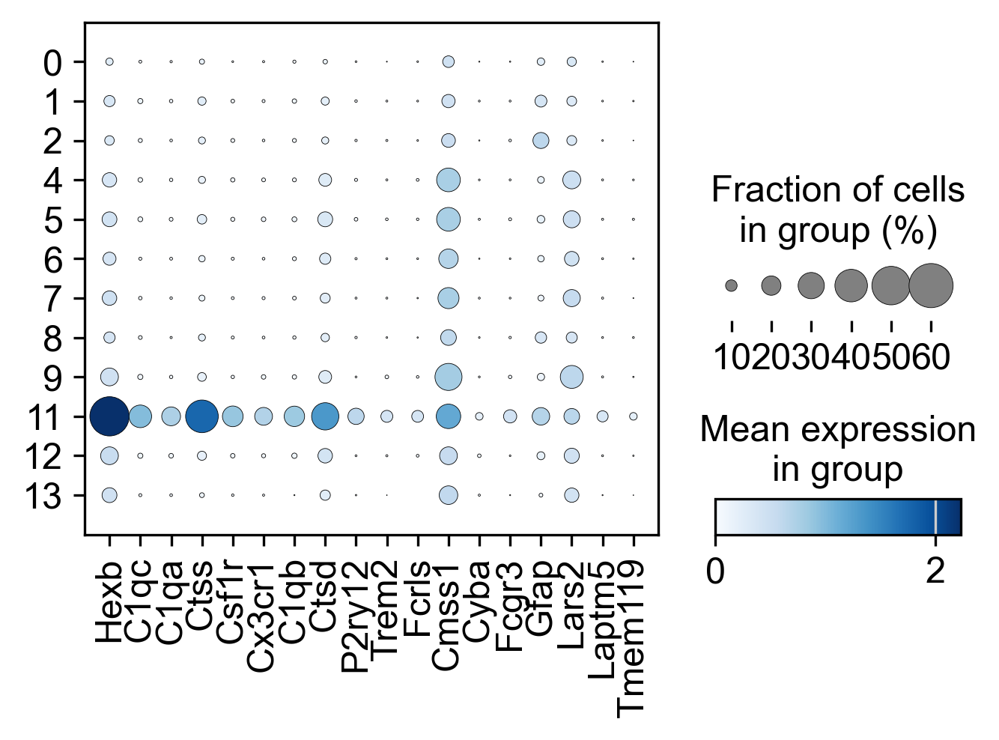

In [86]:
sc.pl.dotplot(adata_expression, markers, groupby="louvain", figsize=(5, 3), cmap='Blues');

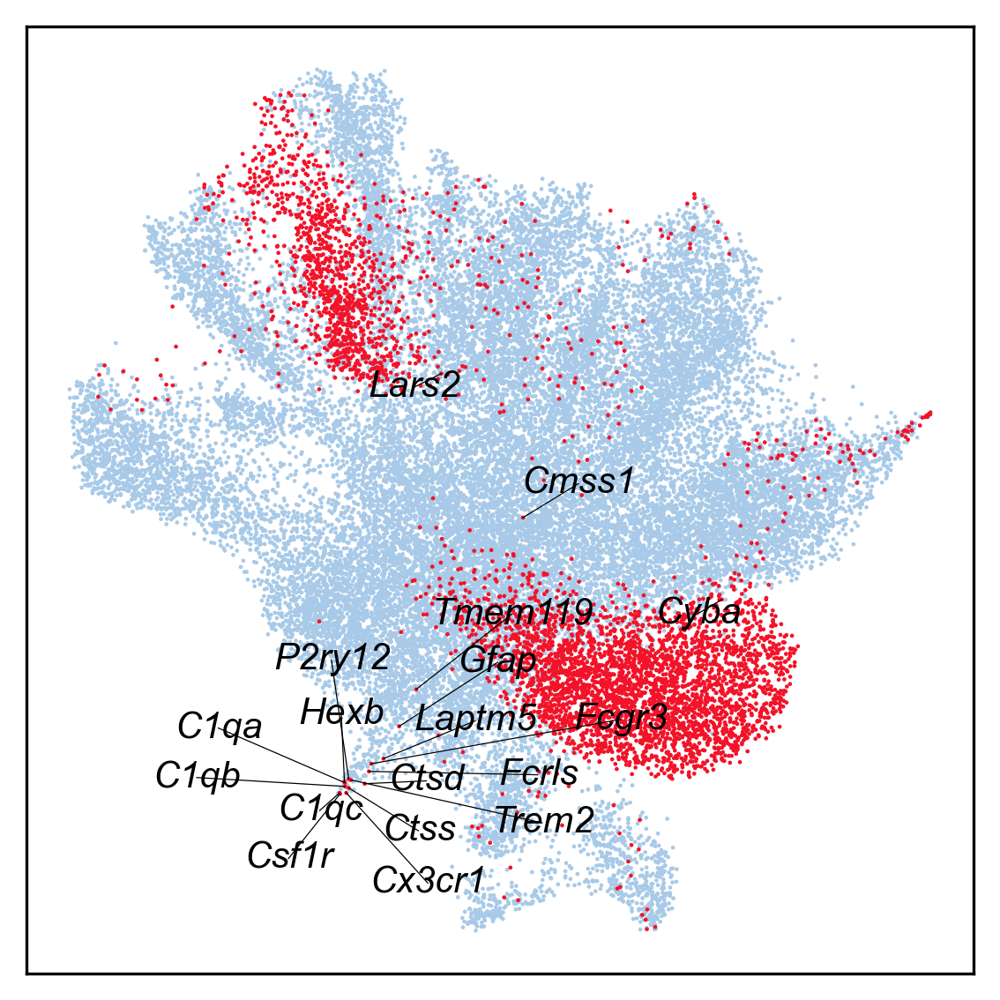

In [82]:
fig = sta.pl.clear_fig(sta.pl.plot_cell_gene(adata_cell_gene, markers, 'cell_gene', legend_loc=None, size=5, line_color='black', title='', dpi=150, figsize=(4, 4), frameon=True))

In [83]:
markers_sub = temp_gene.obs.sort_values(by='clustering_coefficient', ascending=False).head(8).index.tolist()
markers_sub

['Hexb', 'C1qc', 'C1qa', 'Ctss', 'Csf1r', 'Cx3cr1', 'C1qb', 'Ctsd']

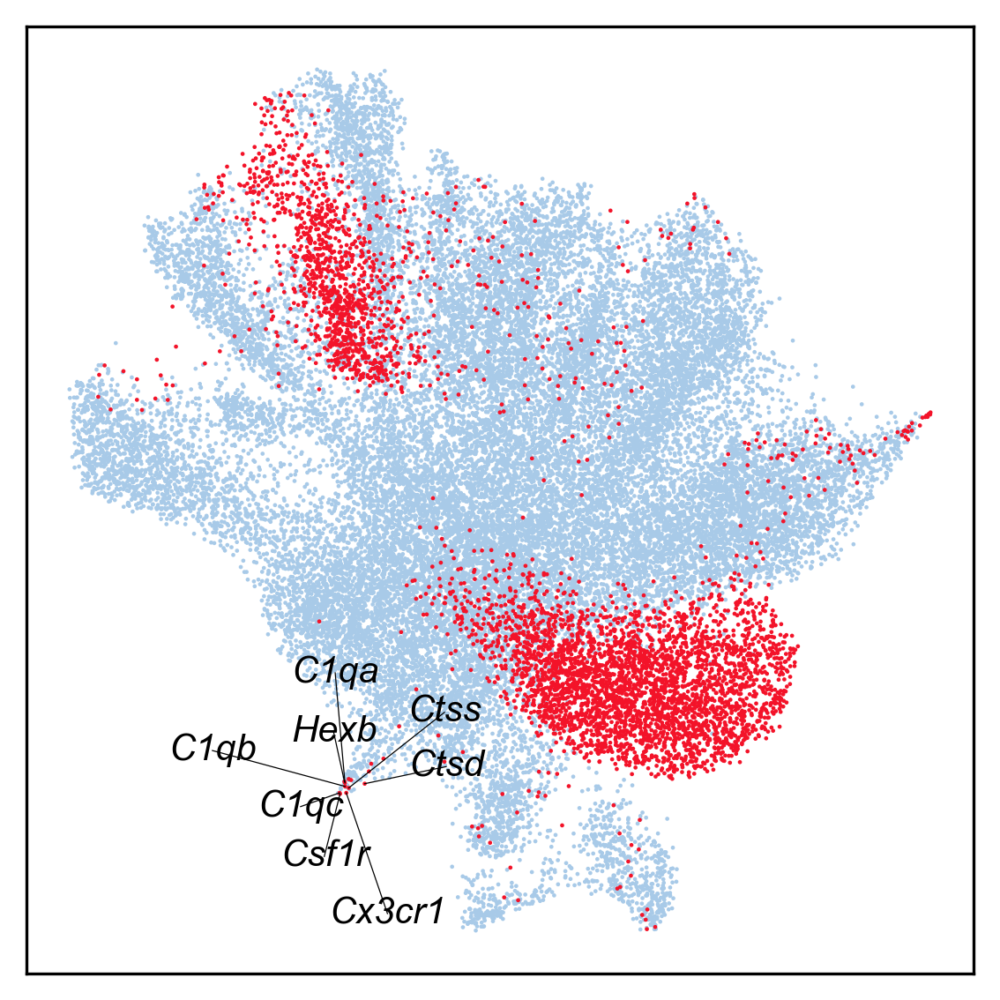

In [84]:
fig = sta.pl.clear_fig(sta.pl.plot_cell_gene(adata_cell_gene, markers_sub, 'cell_gene', legend_loc=None, size=5, line_color='black', title='', dpi=150, figsize=(4, 4), frameon=True))